In [1]:
# Mounting Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Unzipping the zipped folder to extract files inside
!unzip /content/drive/MyDrive/food45.zip

Streaming output truncated to the last 5000 lines.
  inflating: images/strawberry_shortcake/1017466.jpg  
  inflating: images/strawberry_shortcake/1022070.jpg  
  inflating: images/strawberry_shortcake/1024026.jpg  
  inflating: images/strawberry_shortcake/1027835.jpg  
  inflating: images/strawberry_shortcake/1030449.jpg  
  inflating: images/strawberry_shortcake/1031243.jpg  
  inflating: images/strawberry_shortcake/1035413.jpg  
  inflating: images/strawberry_shortcake/1038676.jpg  
  inflating: images/strawberry_shortcake/1039355.jpg  
  inflating: images/strawberry_shortcake/1058937.jpg  
  inflating: images/strawberry_shortcake/1060445.jpg  
  inflating: images/strawberry_shortcake/107049.jpg  
  inflating: images/strawberry_shortcake/1071714.jpg  
  inflating: images/strawberry_shortcake/1079419.jpg  
  inflating: images/strawberry_shortcake/109645.jpg  
  inflating: images/strawberry_shortcake/1115228.jpg  
  inflating: images/strawberry_shortcake/1126431.jpg  
  inflating: ima

### Importing Libraries

In [4]:
import tensorflow as tf
import matplotlib.image as img
%matplotlib inline
import numpy as np
from collections import defaultdict
import collections
import matplotlib.pyplot as plt
import numpy as np
import os
import random

### Listing 45 image classes used

In [ ]:
labels = os.listdir('/content/images')
labels

['chocolate_cake',
 'macarons',
 'omelette',
 'caesar_salad',
 'spaghetti_bolognese',
 'sushi',
 'falafel',
 'french_fries',
 'red_velvet_cake',
 'fried_rice',
 'fish_and_chips',
 'spring_rolls',
 'donuts',
 'greek_salad',
 'club_sandwich',
 'lasagna',
 'ice_cream',
 'ramen',
 'tiramisu',
 'grilled_cheese_sandwich',
 'hot_dog',
 'tacos',
 'dumplings',
 'breakfast_burrito',
 'waffles',
 'strawberry_shortcake',
 'pancakes',
 'garlic_bread',
 'chicken_wings',
 'caprese_salad',
 'churros',
 'apple_pie',
 'hot_and_sour_soup',
 'french_toast',
 'cup_cakes',
 'cheesecake',
 'samosa',
 'macaroni_and_cheese',
 'onion_rings',
 'pizza',
 'bruschetta',
 'chicken_curry',
 'carrot_cake',
 'miso_soup',
 'hamburger']

### Visualizing some of the images from the data

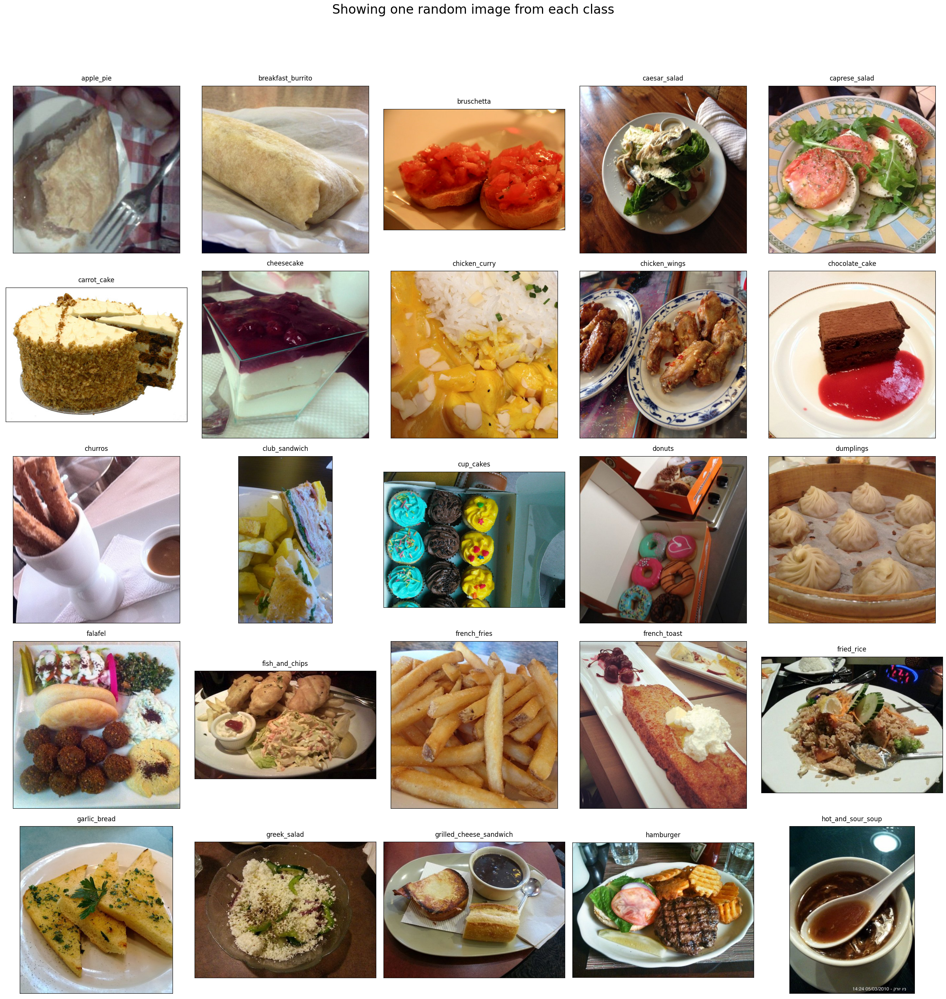

In [ ]:
# Visualize the data
rows = 5
cols = 5
fig, ax = plt.subplots(rows, cols, figsize=(25,25))
fig.suptitle("Showing one random image from each class", y=1.05, fontsize=24) # Adding  y=1.05, fontsize=24 helped me fix the suptitle overlapping with axes issue
data_dir = "/content/images"
foods_sorted = sorted(os.listdir(data_dir))
food_id = 0
for i in range(rows):
  for j in range(cols):
    try:
      food_selected = foods_sorted[food_id] 
      food_id += 1
    except:
      break
    if food_selected == '.DS_Store':
        continue
    food_selected_images = os.listdir(os.path.join(data_dir,food_selected)) # returns the list of all files present in each food category
    food_selected_random = np.random.choice(food_selected_images) # picks one food item from the list as choice, takes a list and returns one random item
    img = plt.imread(os.path.join(data_dir,food_selected, food_selected_random))
    ax[i][j].imshow(img)
    ax[i][j].set_title(food_selected, pad = 10)
    
plt.setp(ax, xticks=[],yticks=[])
plt.tight_layout()

### Splitting data into training set & testing set, further training the model on training set using model-maker, for 5 epochs

In [3]:
!pip install --upgrade tensorflow
!pip install --upgrade tflite-model-maker

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 585.9/585.9 MB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.7/440.7 kB 41.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 99.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 63.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.4/302.4 kB 35.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 82.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 92.2 MB/s eta 0:00:00
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.8.0
    Uninstalling tensorflow-estimator-2.8.0:
      Successfully uninstalled tensorflow-estimator-2.8.0
  Attempting uninstall: tensorboard-data-server
    Found existing installation: tensorboard-data-server 0.6.1
    Uninstalling tens

In [5]:
# importing classifier
from tflite_model_maker import image_classifier
from tflite_model_maker.image_classifier import DataLoader

# Load input data specific to an on-device ML app.
data = DataLoader.from_folder('/content/images')
train_data, test_data = data.split(0.8)

# Customize the TensorFlow model.
model = image_classifier.create(train_data, epochs = 5)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 hub_keras_layer_v1v2 (HubKe  (None, 1280)             3413024   
 rasLayerV1V2)                                                   
                                                                 
 dropout (Dropout)           (None, 1280)              0         
                                                                 
 dense (Dense)               (None, 45)                57645     
                                                                 
Total params: 3,470,669
Trainable params: 57,645
Non-trainable params: 3,413,024
_________________________________________________________________
None
Epoch 1/5
1125/1125 [==============================] - 329s 284ms/step - loss: 2.0802 - accuracy: 0.5747
Epoch 2/5
1125/1125 [==============================] - 305s 271ms/step - loss: 1.7262 - accuracy: 0.6837
Epoch 3/5
1125/1125 [===

### The model gave us an accuracy of ~73% on training data, over 5 epochs, next we will check the performance of model on testing data and its corresponding loss.

In [6]:
loss, accuracy = model.evaluate(test_data)

282/282 [==============================] - 117s 274ms/step - loss: 1.6176 - accuracy: 0.7171


In [ ]:
print("Loss on Test Data, for 5 epochs",loss)
print("Accuracy on Test Data, for 5 epochs",accuracy)

In [8]:
import numpy as np
from sklearn.metrics import classification_report
predictions = model.predict_top_k(test_data)

In [ ]:
true_labels = []
for image, label in test_data.gen_dataset().unbatch():
    true_labels.append(test_data.index_to_label[label.numpy()])

In [ ]:
true_labels

In [11]:
pred_labels = [pred[0][0] for pred in predictions]
pred_labels

['cheesecake',
 'chicken_curry',
 'chicken_wings',
 'dumplings',
 'red_velvet_cake',
 'chocolate_cake',
 'red_velvet_cake',
 'strawberry_shortcake',
 'macarons',
 'samosa',
 'caprese_salad',
 'greek_salad',
 'lasagna',
 'greek_salad',
 'tiramisu',
 'spaghetti_bolognese',
 'french_toast',
 'spring_rolls',
 'french_fries',
 'fish_and_chips',
 'garlic_bread',
 'churros',
 'garlic_bread',
 'chicken_curry',
 'sushi',
 'cheesecake',
 'red_velvet_cake',
 'hamburger',
 'red_velvet_cake',
 'dumplings',
 'pizza',
 'hot_dog',
 'french_toast',
 'hot_dog',
 'grilled_cheese_sandwich',
 'chocolate_cake',
 'churros',
 'falafel',
 'red_velvet_cake',
 'spaghetti_bolognese',
 'spaghetti_bolognese',
 'sushi',
 'french_fries',
 'apple_pie',
 'french_fries',
 'chicken_wings',
 'caesar_salad',
 'macaroni_and_cheese',
 'dumplings',
 'fried_rice',
 'grilled_cheese_sandwich',
 'cup_cakes',
 'cup_cakes',
 'fried_rice',
 'onion_rings',
 'ramen',
 'churros',
 'caesar_salad',
 'waffles',
 'spring_rolls',
 'cheeseca

In [12]:
print(classification_report(true_labels, pred_labels))

                         precision    recall  f1-score   support

              apple_pie       0.49      0.44      0.47       169
      breakfast_burrito       0.75      0.59      0.66       208
             bruschetta       0.57      0.61      0.58       193
           caesar_salad       0.79      0.74      0.76       213
          caprese_salad       0.67      0.63      0.65       218
            carrot_cake       0.66      0.61      0.63       195
             cheesecake       0.52      0.58      0.54       203
          chicken_curry       0.65      0.63      0.64       191
          chicken_wings       0.78      0.83      0.81       210
         chocolate_cake       0.65      0.64      0.65       194
                churros       0.84      0.79      0.81       191
          club_sandwich       0.78      0.71      0.74       180
              cup_cakes       0.80      0.74      0.77       214
                 donuts       0.67      0.72      0.70       190
              dumplings 

In [ ]:
# importing libray to plot figures
import matplotlib.pyplot as plt

### Predicting the images in testing set, black labels denote the correctly classified labels while red labels denote the wrong ones.

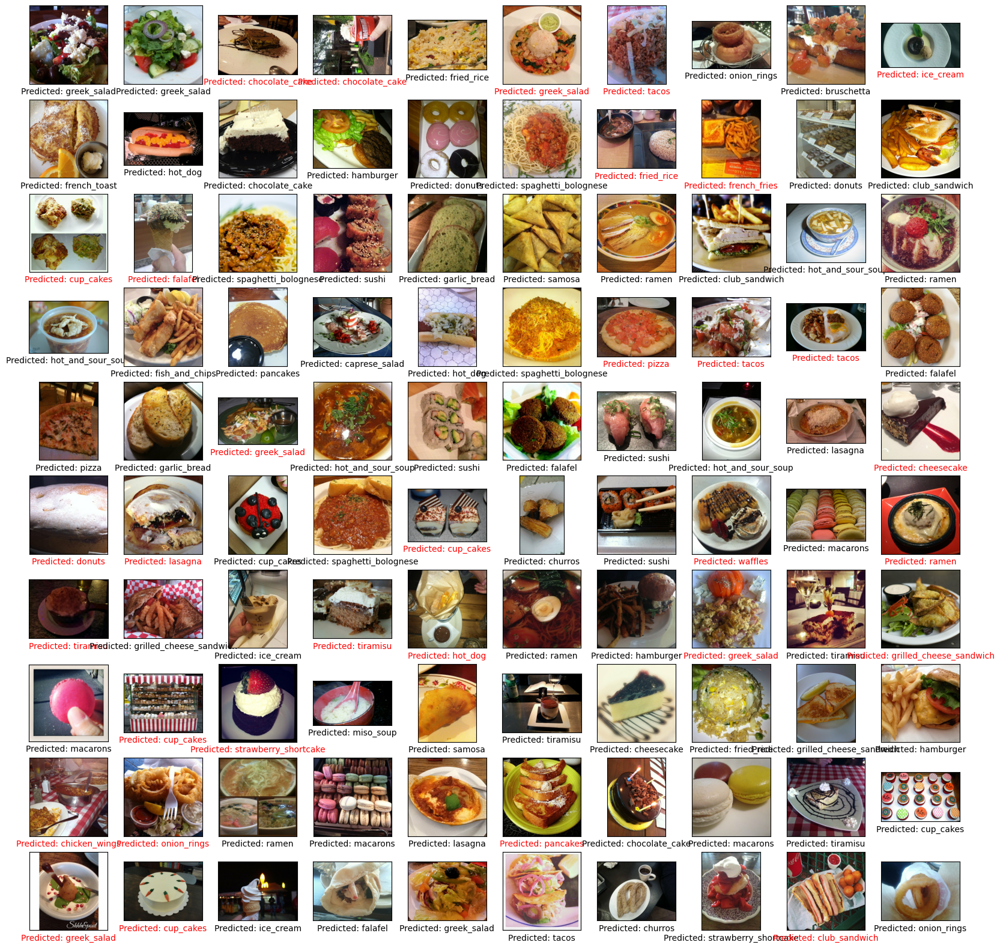

In [ ]:
# A helper function that returns 'red'/'black' depending on if its two input
# parameter matches or not.
def get_label_color(val1, val2):
  if val1 == val2:
    return 'black'
  else:
    return 'red'

# Then plot 100 test images and their predicted labels.
# If a prediction result is different from the label provided label in "test"
# dataset, we will highlight it in red color.
plt.figure(figsize=(20, 20))
predicts = model.predict_top_k(test_data)
for i, (image, label) in enumerate(test_data.gen_dataset().unbatch().take(100)):
  ax = plt.subplot(10, 10, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(image.numpy(), cmap=plt.cm.gray)
  predict_label = predicts[i][0][0]
  color = get_label_color(predict_label,
                          test_data.index_to_label[label.numpy()])
  ax.xaxis.label.set_color(color)
  plt.xlabel('Predicted: %s' % predict_label)
plt.show()

In [ ]:
import warnings
# Suppress all warnings
warnings.filterwarnings('ignore')
# importing classifier
from tflite_model_maker import image_classifier
from tflite_model_maker.image_classifier import DataLoader
# Load input data specific to an on-device ML app.
data = DataLoader.from_folder('/content/images')
train_data, test_data = data.split(0.8)

# Customize the TensorFlow model.
model = image_classifier.create(train_data, epochs = 30, batch_size = 32)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 hub_keras_layer_v1v2_1 (Hub  (None, 1280)             3413024   
 KerasLayerV1V2)                                                 
                                                                 
 dropout_1 (Dropout)         (None, 1280)              0         
                                                                 
 dense_1 (Dense)             (None, 45)                57645     
                                                                 
Total params: 3,470,669
Trainable params: 57,645
Non-trainable params: 3,413,024
_________________________________________________________________
None
Epoch 1/30
1125/1125 [==============================] - 305s 270ms/step - loss: 2.0825 - accuracy: 0.5750
Epoch 2/30
1125/1125 [==============================] - 306s 272ms/step - loss: 1.7327 - accuracy: 0.6814
Epoch 3/30
1125/1125

### The model gave us an accuracy of ~78% on training data, over 30 epochs, next we will check the performance of model on testing data and its corresponding loss.

In [ ]:
loss_30, accuracy_30 = model.evaluate(test_data)

282/282 [==============================] - 117s 264ms/step - loss: 1.5795 - accuracy: 0.7416


In [ ]:
print("Loss on Test Data, for 30 epochs",loss_30)
print("Accuracy on Test Data, for 30 epochs",accuracy_30)

Loss on Test Data, for 30 epochs 1.5795499086380005
Accuracy on Test Data, for 30 epochs 0.7415555715560913


In [ ]:
import numpy as np
from sklearn.metrics import classification_report
predictions = model.predict_top_k(test_data)

In [ ]:
true_labels = []
for image, label in test_data.gen_dataset().unbatch():
    true_labels.append(test_data.index_to_label[label.numpy()])

pred_labels = [pred[0][0] for pred in predictions]
pred_labels

['greek_salad',
 'chocolate_cake',
 'waffles',
 'french_fries',
 'greek_salad',
 'sushi',
 'hot_dog',
 'tacos',
 'tiramisu',
 'greek_salad',
 'cheesecake',
 'strawberry_shortcake',
 'tiramisu',
 'chicken_wings',
 'fried_rice',
 'tiramisu',
 'french_fries',
 'cup_cakes',
 'macaroni_and_cheese',
 'samosa',
 'breakfast_burrito',
 'bruschetta',
 'garlic_bread',
 'churros',
 'donuts',
 'strawberry_shortcake',
 'caesar_salad',
 'spaghetti_bolognese',
 'french_fries',
 'spring_rolls',
 'chocolate_cake',
 'french_fries',
 'hamburger',
 'fish_and_chips',
 'fried_rice',
 'donuts',
 'ramen',
 'chocolate_cake',
 'chicken_wings',
 'omelette',
 'red_velvet_cake',
 'hot_and_sour_soup',
 'omelette',
 'bruschetta',
 'cheesecake',
 'miso_soup',
 'hot_dog',
 'ice_cream',
 'pancakes',
 'donuts',
 'churros',
 'onion_rings',
 'falafel',
 'french_fries',
 'carrot_cake',
 'samosa',
 'cheesecake',
 'bruschetta',
 'omelette',
 'hamburger',
 'cup_cakes',
 'caprese_salad',
 'pizza',
 'pizza',
 'tiramisu',
 'macar

In [ ]:
print(classification_report(true_labels, pred_labels))

                         precision    recall  f1-score   support

              apple_pie       0.52      0.52      0.52       210
      breakfast_burrito       0.69      0.76      0.72       204
             bruschetta       0.64      0.59      0.62       178
           caesar_salad       0.78      0.80      0.79       200
          caprese_salad       0.68      0.76      0.72       186
            carrot_cake       0.69      0.65      0.67       191
             cheesecake       0.51      0.45      0.48       177
          chicken_curry       0.78      0.65      0.71       200
          chicken_wings       0.89      0.79      0.84       204
         chocolate_cake       0.64      0.58      0.61       219
                churros       0.84      0.80      0.82       184
          club_sandwich       0.78      0.75      0.77       195
              cup_cakes       0.73      0.76      0.74       198
                 donuts       0.74      0.70      0.72       218
              dumplings 

### Predicting the images in testing set, black labels denote the correctly classified labels while red labels denote the wrong ones.

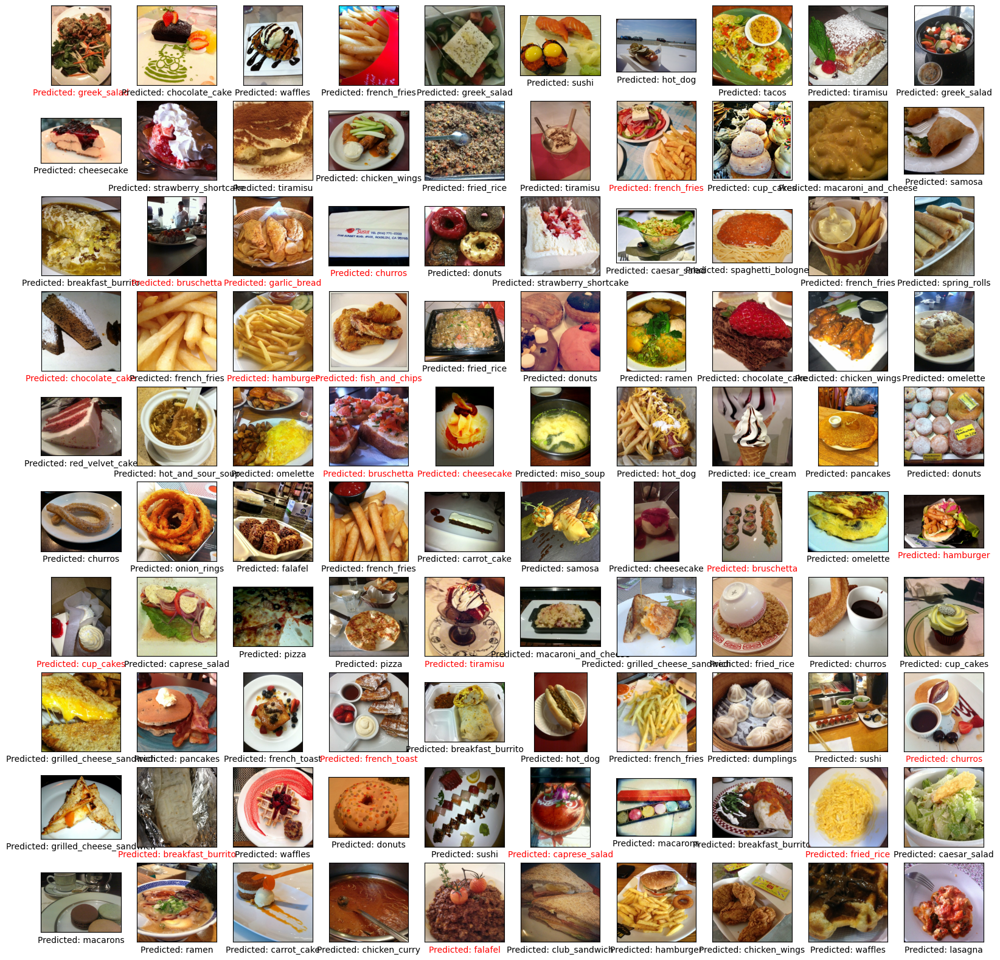

In [ ]:
# importing libray to plot figures
import matplotlib.pyplot as plt
# A helper function that returns 'red'/'black' depending on if its two input
# parameter matches or not.
def get_label_color(val1, val2):
  if val1 == val2:
    return 'black'
  else:
    return 'red'

# Then plot 100 test images and their predicted labels.
# If a prediction result is different from the label provided label in "test"
# dataset, we will highlight it in red color.
plt.figure(figsize=(20, 20))
predicts = model.predict_top_k(test_data)
for i, (image, label) in enumerate(test_data.gen_dataset().unbatch().take(100)):
  ax = plt.subplot(10, 10, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(image.numpy(), cmap=plt.cm.gray)

  predict_label = predicts[i][0][0]
  color = get_label_color(predict_label,
                          test_data.index_to_label[label.numpy()])
  ax.xaxis.label.set_color(color)
  plt.xlabel('Predicted: %s' % predict_label)
plt.show()

In [ ]:
# Saving the tflite model for future use
model.export(export_dir='.')